In [111]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from torchvision.utils import make_grid
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np
import os

In [112]:
# from google.colab import drive
# drive.mount('//content//drive')


In [113]:
# !pip install -q kaggle
# from google.colab import files
# files.upload()
# !mkdir ~/.kaggle
# !cp kaggle.json ~/.kaggle/
# !chmod 600 ~/.kaggle/kaggle.json
# !kaggle datasets download -d kwentar/blur-dataset
# !unzip blur-dataset.zip

In [114]:
class DeblurDataset(Dataset):
    def __init__(self, blurry_images_list, sharp_images_list, transform):
        self.blurry_images_list = blurry_images_list
        self.sharp_images_list = sharp_images_list
        self.transform = transform

    def __len__(self):
        return len(self.blurry_images_list)

    def __getitem__(self, idx):
        blurry_image = Image.open(self.blurry_images_list[idx])
        sharp_image = Image.open(self.sharp_images_list[idx])

        blurry_image = self.transform(blurry_image)
        sharp_image = self.transform(sharp_image)
        return blurry_image, sharp_image

In [115]:
transform = transforms.Compose([
    transforms.Resize((256, 256)),
    transforms.ToTensor(),
])

In [116]:
bpath = '/content/motion_blurred'
blurry_images_list = sorted(list(bpath + '/' + filename for filename in sorted(os.listdir(bpath))))

spath = '/content/sharp'
sharp_images_list = sorted(list(spath + '/' + filename for filename in sorted(os.listdir(spath))))

dataset = DeblurDataset(blurry_images_list, sharp_images_list, transform=transform)
train_dataset, test_dataset = torch.utils.data.random_split(dataset, [int(0.8*len(dataset)), len(dataset) - int(0.8*len(dataset))])
train_dataloader = DataLoader(train_dataset, batch_size=4, shuffle=False)
test_dataloader = DataLoader(test_dataset, batch_size=3, shuffle=False)

In [117]:
class DoubleConv(nn.Module):
  def __init__(self, in_channels, out_channels):
        super().__init__()
        self.double_conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
            nn.BatchNorm2d(out_channels),
            nn.ReLU(inplace=True)
        )

  def forward(self, x):
       return self.double_conv(x)

In [118]:
class Down(nn.Module):

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.avgpool_conv = nn.Sequential(
            nn.AvgPool2d(2),
            DoubleConv(in_channels, out_channels)
        )

    def forward(self, x):
        return self.avgpool_conv(x)


In [119]:
class Up(nn.Module):
    """Upscaling then double conv"""

    def __init__(self, in_channels, out_channels):
        super().__init__()
        self.up = nn.ConvTranspose2d(in_channels , in_channels // 2, kernel_size=2, stride=2)
        self.conv = DoubleConv(in_channels, out_channels)

    def forward(self, x1, x2):
        x1 = self.up(x1)
        x = torch.cat([x2, x1], dim=1)
        return self.conv(x)


In [120]:
class OutConv(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(OutConv, self).__init__()
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size=1)

    def forward(self, x):
        return torch.sigmoid(self.conv(x))

In [121]:
class UNet(nn.Module):
    def __init__(self, in_channels, out_channels):
        super(UNet, self).__init__()
        self.in_channels = in_channels
        self.out_channels = out_channels

        self.inc = DoubleConv(in_channels, 64)
        self.down1 = Down(64, 128)
        self.down2 = Down(128, 256)
        self.down3 = Down(256, 512)
        self.down4 = Down(512, 1024)
        self.up1 = Up(1024, 512)
        self.up2 = Up(512, 256 )
        self.up3 = Up(256, 128)
        self.up4 = Up(128, 64)
        self.outc = OutConv(64, out_channels)

    def forward(self, x):
        x1 = self.inc(x)
        x2 = self.down1(x1)
        x3 = self.down2(x2)
        x4 = self.down3(x3)
        x5 = self.down4(x4)
        x = self.up1(x5, x4)
        x = self.up2(x, x3)
        x = self.up3(x, x2)
        x = self.up4(x, x1)
        out = self.outc(x)
        return out


In [122]:
def visualise_batch(batch, title):
  grid = make_grid(batch)
  plt.imshow(grid.cpu().detach().numpy().transpose(1,2,0))
  plt.title(title)
  plt.show()

In [123]:
# for i, batch in enumerate(train_dataset):
#   visualise_batch(batch[0],'blurred')
#   visualise_batch(batch[1],'sharp')

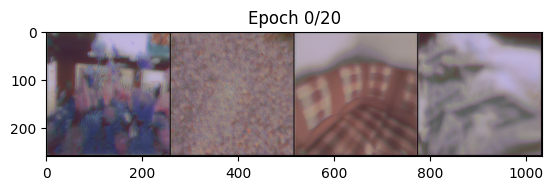

Epoch [1/20], Loss: 0.0499


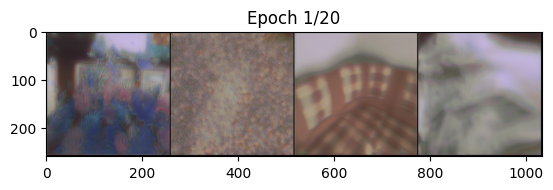

Epoch [2/20], Loss: 0.0447


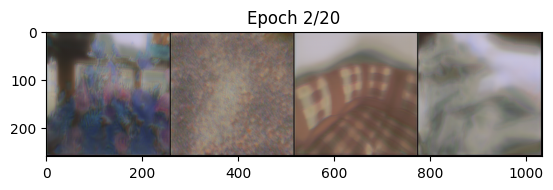

Epoch [3/20], Loss: 0.0433


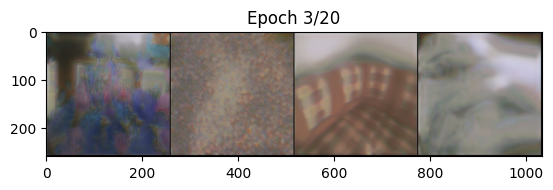

Epoch [4/20], Loss: 0.0426


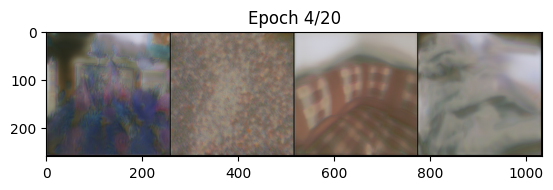

Epoch [5/20], Loss: 0.0421


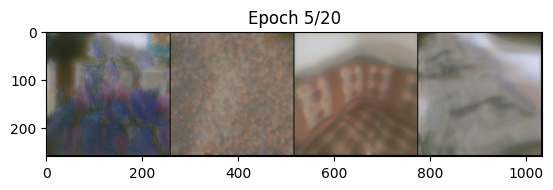

Epoch [6/20], Loss: 0.0416


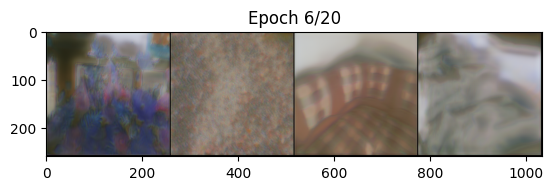

Epoch [7/20], Loss: 0.0417


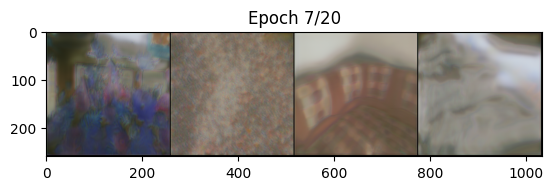

Epoch [8/20], Loss: 0.0409


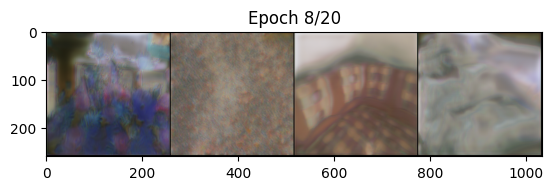

Epoch [9/20], Loss: 0.0407


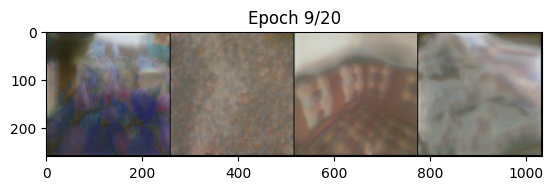

Epoch [10/20], Loss: 0.0402


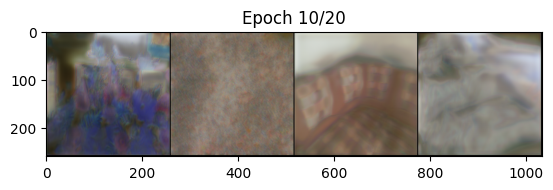

Epoch [11/20], Loss: 0.0399


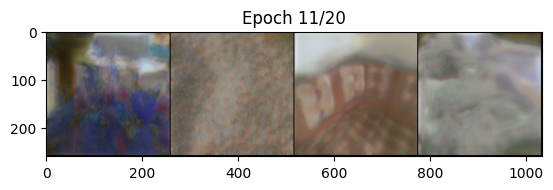

Epoch [12/20], Loss: 0.0397


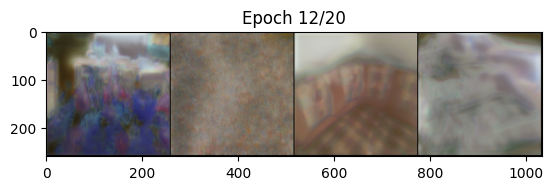

Epoch [13/20], Loss: 0.0393


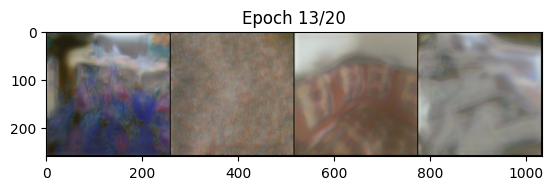

Epoch [14/20], Loss: 0.0390


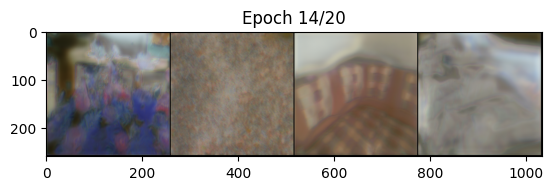

Epoch [15/20], Loss: 0.0391


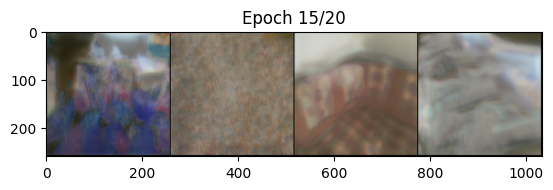

Epoch [16/20], Loss: 0.0385


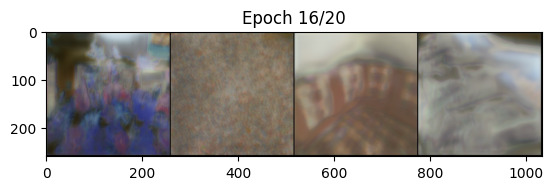

Epoch [17/20], Loss: 0.0381


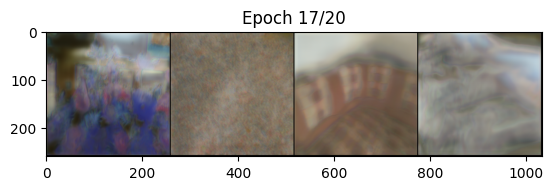

Epoch [18/20], Loss: 0.0376


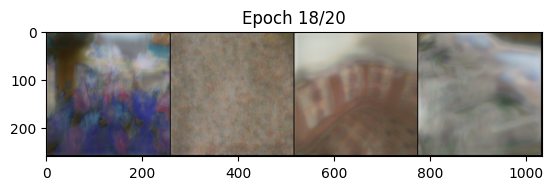

Epoch [19/20], Loss: 0.0368


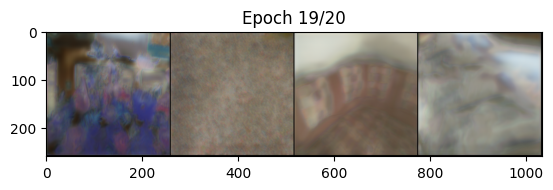

Epoch [20/20], Loss: 0.0369


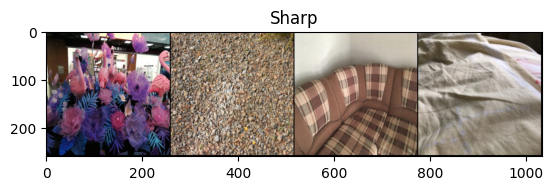

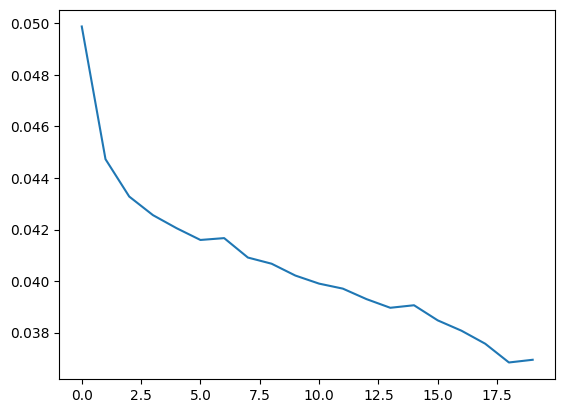

In [110]:
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
model = UNet(in_channels=3, out_channels=3).to(device)
optimizer = torch.optim.Adam(model.parameters(), lr=0.0001)
criterion = nn.MSELoss()

num_epochs = 20
losses = []
for epoch in range(num_epochs):
    model.train(True)
    running_loss = 0.0

    for batch in iter(train_dataloader):
        blurry_images = batch[0].to(device)
        sharp_images = batch[1].to(device)

        optimizer.zero_grad()
        outputs = model(blurry_images)
        loss = criterion(outputs, sharp_images)
        loss.backward()
        optimizer.step()

        running_loss += loss.item()

    visualise_batch(outputs, f'Epoch {epoch}/{num_epochs}')
    epoch_loss = running_loss / len(train_dataloader)
    losses.append(epoch_loss)
    print(f"Epoch [{epoch + 1}/{num_epochs}], Loss: {epoch_loss:.4f}")
visualise_batch(batch[1], 'Sharp')
plt.plot(losses)

In [124]:
def visualize_results(model, blurry_image_path, transform):
    model.eval()
    with torch.no_grad():
        blurry_image = Image.open(blurry_image_path)
        blurry_image = transform(blurry_image).to(device)
        blurry_image = blurry_image.view((1,3,256,256))
        output = model(blurry_image).cpu().numpy()[0].transpose(1, 2, 0)

        plt.figure(figsize=(10, 5))
        plt.subplot(1, 2, 1)
        plt.title("Blurry Image")
        plt.imshow(blurry_image.cpu().numpy()[0].transpose(1, 2, 0))

        plt.subplot(1, 2, 2)
        plt.title("Deblurred Image")
        plt.imshow(output)
        plt.show()

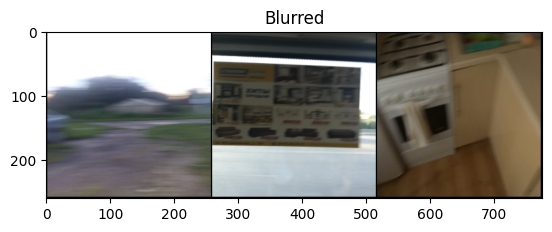

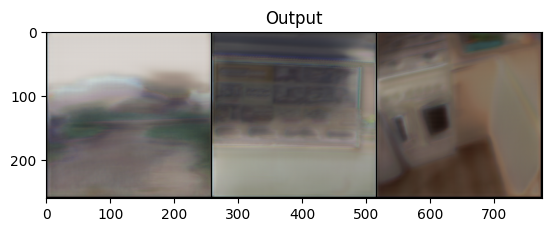

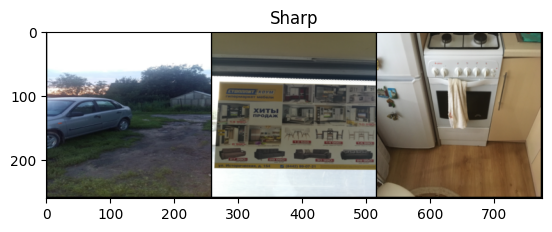

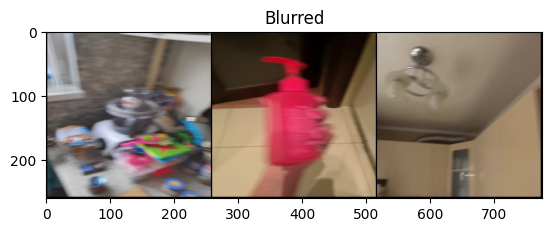

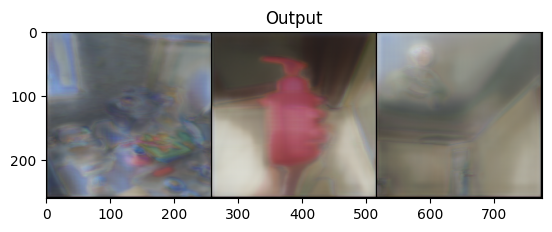

...

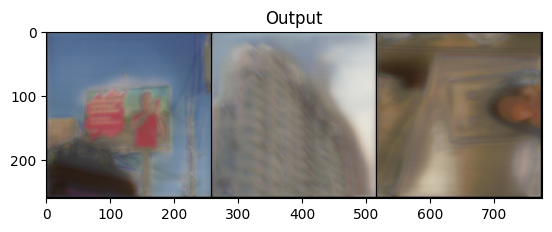

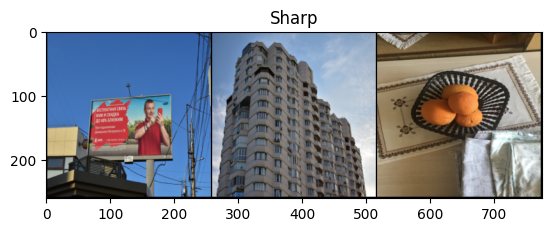

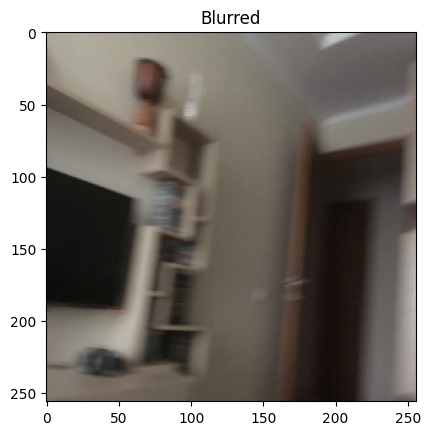

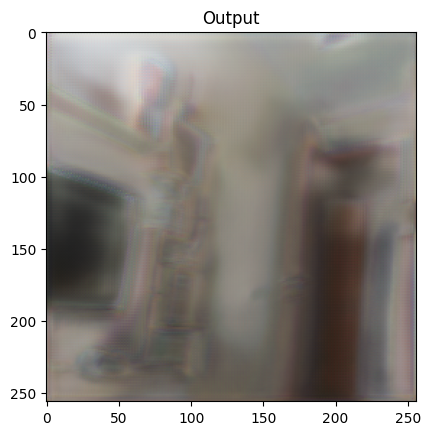

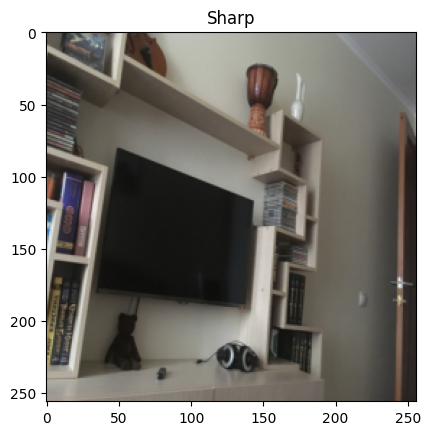

In [125]:
for i, batch in enumerate(test_dataloader):
  # blur_images, sharp_images = batch
  blur_images = batch[0]
  sharp_images = batch[1]
  output = model(blur_images.to(device))
  # blur_images = transform(blur_images.cpu().numpy())
  # sharp_images = transform(sharp_images.cpu().numpy())
  visualise_batch(blur_images, 'Blurred')
  visualise_batch(output, 'Output')
  visualise_batch(sharp_images, 'Sharp')